# Class 11: Clustering & Community Detection 2 — Contemporary

Goal of today's class:
1. Isolate issues with modularity
2. Introduce a statistical framework for community detection
3. Graph!Tool! 

*Acknowledgement: This lesson was made in collaboration with Erik Weis, a PhD student in Network Science at Northeastern University.*
__________

1. Come in. Sit down. Open Teams.
2. Make sure your notebook from last class is saved.
3. Open up the Jupyter Lab server.
4. Open up the Jupyter Lab terminal.
5. Activate Conda: `module load anaconda3/2022.05`
6. Activate the shared virtual environment: `source activate /courses/PHYS7332.202510/shared/graphtool/` !!!!!!!!!!!!!!
7. Run `python3 git_fixer2.py`
8. Github:
    - git status (figure out what files have changed)
    - git add ... (add the file that you changed, aka the `_MODIFIED` one(s))
    - git commit -m "your changes"
    - git push origin main
________

In [1]:
import networkx as nx
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
from matplotlib import rc
rc('axes', fc='w')
rc('figure', fc='w')
rc('savefig', fc='w')
rc('axes', axisbelow=True)

## Trouble in Modularity Paradise...

Let's start with two exercises to motivate today's lesson, both of which point to a deep concern in the utility of *modularity* as a graph property and as a measure to optimize over when identifying communities in networks.

Recall that the modularity, $Q$, of a given partition $C$ of our adjacency matrix $A$ is:

$$Q (A,C) = \frac{1}{2M} \sum_{i,j} \left( A_{ij} - \frac{k_i k_j}{2M} \right) \delta (C_i,C_j) $$

The key idea behind this measure was that to calculate the number of within-community edges that exist above and beyond what we'd expect just based on nodes' degrees. What follows is the assumption (or, rather, the hope) that we should not find community structure in Erdős–Rényi random graphs. Let's explore this with two exercises where we run a modularity-maximizing community detection algorithm over hundreds of ER graphs.

Using a graph of size $N=200$, loop over various values for $p$ to create many ER graphs. Compute the `community.best_partition` of each of these, and store the following:

1. The modularity of the `best_partition` for each randomly generated graph.
2. The number of communities detected in each partition.

In [2]:
import community
plist = np.logspace(-3.5,0,501)
N = 200
modularity_out = []
num_commun_out = []

for p in plist:
    G_i = nx.erdos_renyi_graph(N,p)
    part_i = community.best_partition(G_i)
    num_commun_out.append(len(set(part_i.values())))
    modularity_out.append(community.modularity(part_i, G_i))

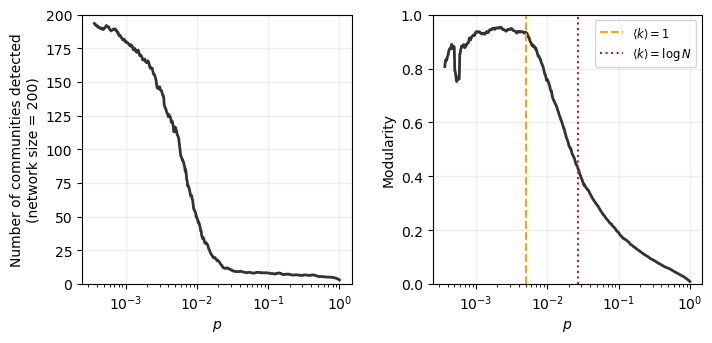

In [3]:
fig, ax = plt.subplots(1,2,figsize=(8,3.5),dpi=100)
plt.subplots_adjust(wspace=0.3)

ax[0].semilogx(plist, pd.Series(num_commun_out).rolling(window=10).mean(), color='.2', lw=2)
ax[1].semilogx(plist, pd.Series(modularity_out).rolling(window=10).mean(), color='.2', lw=2)

ax[0].set_ylabel('Number of communities detected\n(network size = 200)')
ax[0].set_xlabel(r'$p$')
ax[0].set_ylim(0,N)

ax[1].vlines(1/(N-1),0,1,ls='--',color='orange',label=r'$\langle k \rangle = 1$')
ax[1].vlines(np.log(N)/(N-1),0,1,ls=':',color='firebrick',label=r'$\langle k \rangle = \log N$')
ax[1].legend(fontsize='small')
ax[1].set_ylabel('Modularity')
ax[1].set_xlabel(r'$p$')
ax[1].set_ylim(0,1)
ax[0].grid(alpha=0.25, lw=1, color='.75')
ax[1].grid(alpha=0.25, lw=1, color='.75')

plt.show()

What does this mean?

What does this mean for real networks? Let's find out.
________
For reference, let's load the PolBlogs datasets from class 2 and 3:

In [4]:
rc('axes', fc='w')
rc('figure', fc='w')
rc('savefig', fc='w')

digraph = nx.DiGraph()
with open('data/polblogs_nodes_class.tsv','r') as fp:
    for line in fp:
        node_id, node_label, node_political = line.strip().split('\t')
        political_orientation = 'liberal' if node_political == '0' else 'conservative'
        digraph.add_node(node_id, website=node_label, political_orientation=political_orientation)
        
with open('data/polblogs_edges_class.tsv','r') as fp:
    for line in fp:
        source_node_id, target_node_id = line.strip().split('\t')
        digraph.add_edge(source_node_id, target_node_id)

# just select the largest strongly connected component, and 
sccs = sorted(nx.strongly_connected_components(digraph), key=len, reverse=True)
G = nx.to_undirected(digraph.subgraph(sccs[0]))

# get the political leanings and assign them to colors
cols = ["#c5c03a","#7275d7","#8fb755","#c361bd","#5ec384","#d3537a","#3fe0d8","#cb6b3b"]
leanings = nx.get_node_attributes(G,'political_orientation')
node_colors = [cols[0] if leaning=='conservative' else cols[1] \
               for leaning in leanings.values()]

edge_colors = '.4'
pos = nx.spring_layout(G)

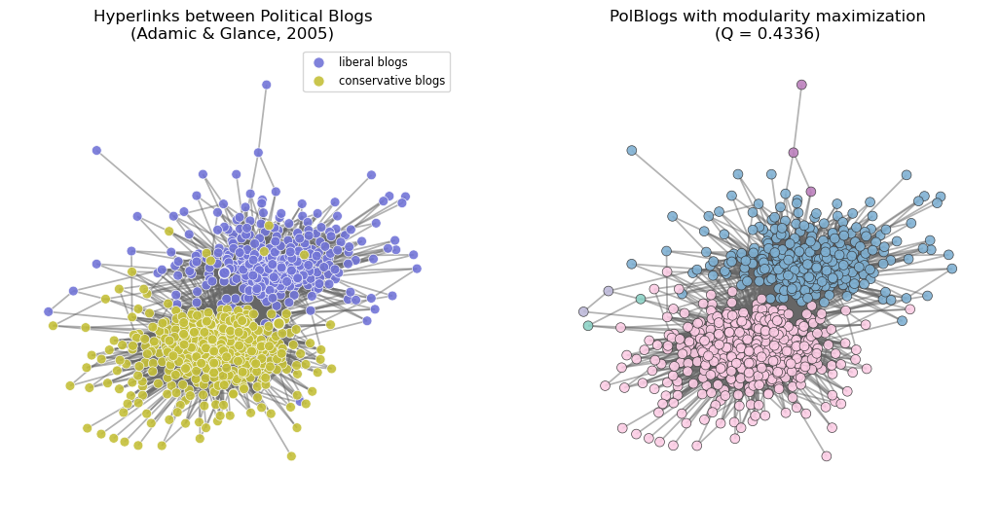

In [5]:
fig, ax = plt.subplots(1,2,figsize=(13,6),dpi=100)

nx.draw_networkx_nodes(G, pos, node_color=node_colors,
                       node_size=50, edgecolors='w', alpha=0.9, linewidths=0.5, ax=ax[0])
nx.draw_networkx_edges(G, pos, edge_color=edge_colors, width=1.25, alpha=0.5, ax=ax[0])
ax[0].set_title('Hyperlinks between Political Blogs\n(Adamic & Glance, 2005)', fontsize='large')
ax[0].set_axis_off()

legend_node0 = '0'
legend_node1 = '1000'
nx.draw_networkx_nodes(G, {legend_node0:pos[legend_node0]}, nodelist=[legend_node0], 
                       label='liberal blogs', 
                       node_color=cols[1], node_size=70, edgecolors='w', alpha=0.9, ax=ax[0])
nx.draw_networkx_nodes(G, {legend_node1:pos[legend_node1]}, nodelist=[legend_node1], 
                       label='conservative blogs',
                       node_color=cols[0], node_size=70, edgecolors='w', alpha=0.9, ax=ax[0])
ax[0].legend(fontsize='small')


part = community.best_partition(G)
ncs = plt.cm.Set3([i/len(set(part.values())) for i in part.values()])

nx.draw_networkx_nodes(G, pos, node_color=ncs,
                       node_size=50, edgecolors='.2', alpha=0.9, linewidths=0.5, ax=ax[1])
nx.draw_networkx_edges(G, pos, edge_color=edge_colors, width=1.25, alpha=0.5, ax=ax[1])

ax[1].set_title('PolBlogs with modularity maximization\n(Q = %.4f)'%community.modularity(part,G),
                fontsize='large')
ax[1].set_axis_off()


plt.show()

Where does the PolBlogs modularity fall in our plot from above?

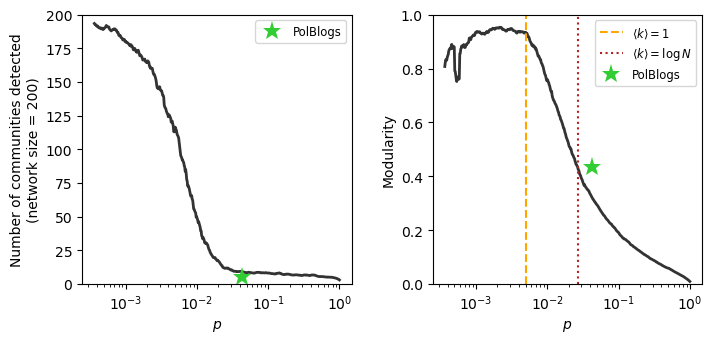

In [6]:
fig, ax = plt.subplots(1,2,figsize=(8,3.5),dpi=100)
plt.subplots_adjust(wspace=0.3)

ax[0].semilogx(plist, pd.Series(num_commun_out).rolling(window=10).mean(), color='.2', lw=2)
ax[0].semilogx([nx.density(G)], [len(set(part.values()))], '*',
               markersize=14, color='limegreen', label='PolBlogs', markeredgewidth=0)
ax[1].semilogx(plist, pd.Series(modularity_out).rolling(window=10).mean(), color='.2', lw=2)

ax[0].set_ylabel('Number of communities detected\n(network size = 200)')
ax[0].set_xlabel(r'$p$')
ax[0].set_ylim(0,N)
ax[0].legend(fontsize='small')

ax[1].vlines(1/(N-1),0,1,ls='--',color='orange',label=r'$\langle k \rangle = 1$')
ax[1].vlines(np.log(N)/(N-1),0,1,ls=':',color='firebrick',label=r'$\langle k \rangle = \log N$')
ax[1].semilogx([nx.density(G)],[community.modularity(part,G)], '*', 
               markersize=14, color='limegreen', label='PolBlogs', markeredgewidth=0)
ax[1].legend(fontsize='small')
ax[1].set_ylabel('Modularity')
ax[1].set_xlabel(r'$p$')
ax[1].set_ylim(0,1)


plt.show()

__________

This result is quite remarkable! And known for quite some time! Indeed in 2003, Roger Guimerà, Marta Sales-Pardo, and Luís Amaral published an article exploring this exact issue with the modularity measure.

- Guimera, R., Sales-Pardo, M., & Amaral, L.A.N. (2004). [Modularity from fluctuations in random graphs and complex networks](https://link.aps.org/doi/10.1103/PhysRevE.70.025101). *Physical Review E*, 70(2), 025101.

From the conclusion of their article: "...modularity in networks can arise due to a number of mechanisms. We have demonstrated that networks embedded in low-dimensional spaces have high modularity. We have also shown analytically and numerically that, surprisingly, **random graphs and scale-free networks have high modularity due to fluctuations in the establishment of links**."

They continue, arguing that many of the papers emerging in the early 2000s, which make theoretical claims about some real-world system based on measures of modularity (e.g. biological systems must have evolved to become modular) are potentially incomplete. These claims are based on network data that yields a partition with high ("high") modularity. Crucially, the authors note, this "**relies implicitly on the assumption that random graphs have low modularity.**"

![](images/modularity_from_fluctuations.png)

The authors conclude by arguing that their result paves the way for a notion of statistical significance for modularity (similar to what had been created for clustering coefficients, etc.). However, today, we revisit this paper for a different reason: to emphasize that the problems with modularity maximization don't just stop there (though these findings are particularly damning for a measure purporting to offer a useful and interpretable notion of how strong the community structure is in a graph).

_________

## Enter: `graph-tool`

Note: The remainder of this lesson will draw heavily from the [`graph-tool` documentation](https://graph-tool.skewed.de/) directly. This package is written and maintained almost entirely by [Tiago Peixoto](https://skewed.de/lab/contact.html), professor of Complex Systems and Network Science at IT:U in Linz, Austria.


https://graph-tool.skewed.de/static/doc/quickstart.html

**Punchline:** Use this package to detect communities (and other types of mesoscopic structures!!) in your network data.

![](images/graphtool.png)

In [16]:
import graph_tool.all as gt

### Netzschleuder Integration

![](images/netzschleuder.png)

- Tiago P. Peixoto, "The Netzschleuder network catalogue and repository", https://networks.skewed.de/ (2020). https://doi.org/10.5281/zenodo.7839981

In [27]:
g = gt.collection.ns["ego_social/facebook_combined"]

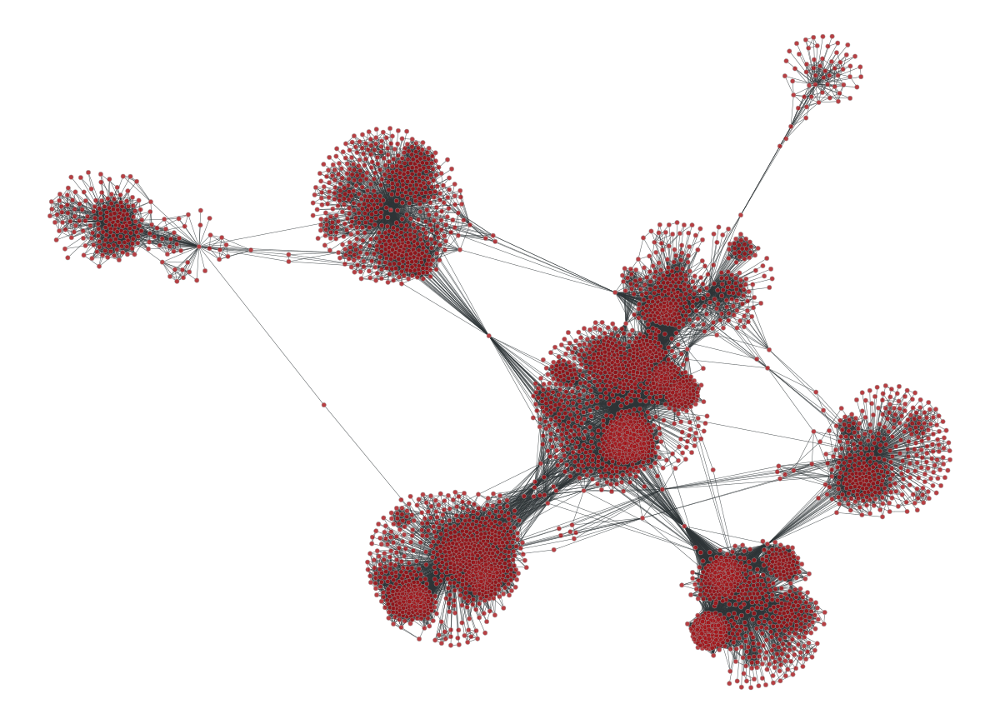

In [28]:
gt.graph_draw(g, g.vp._pos);
#gt.graph_draw(g, g.vp._pos, output="images/pngs/facebook.pdf") # creates large pdf file

In [29]:
state = gt.minimize_blockmodel_dl(g)

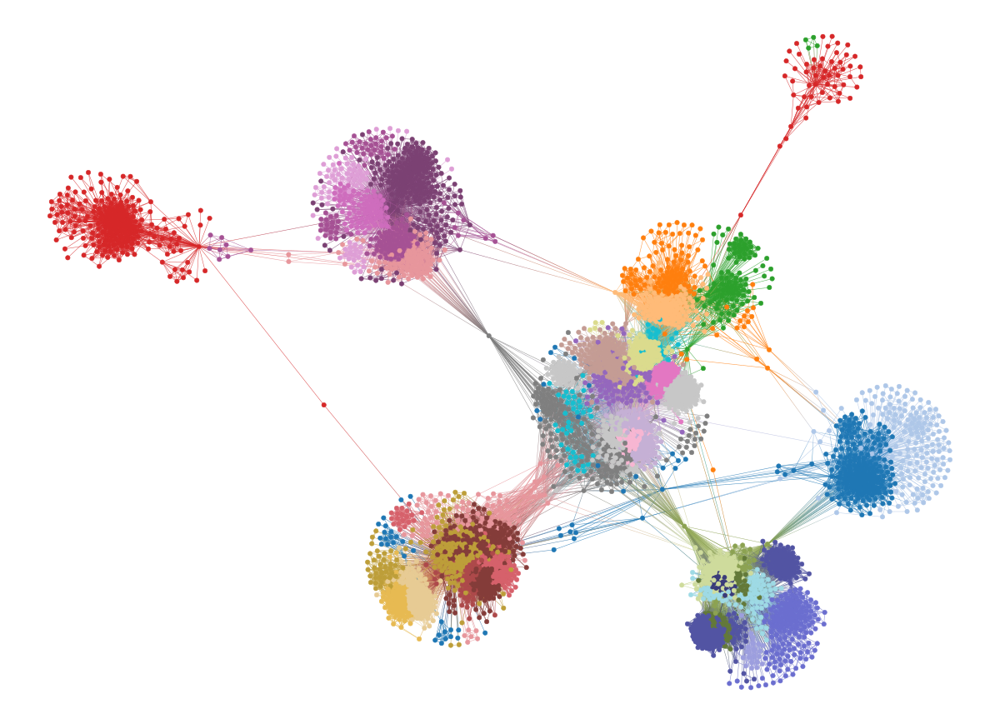

In [30]:
state.draw(pos=g.vp._pos);
state.draw(pos=g.vp._pos, output="images/pngs/facebook-sbm.png");

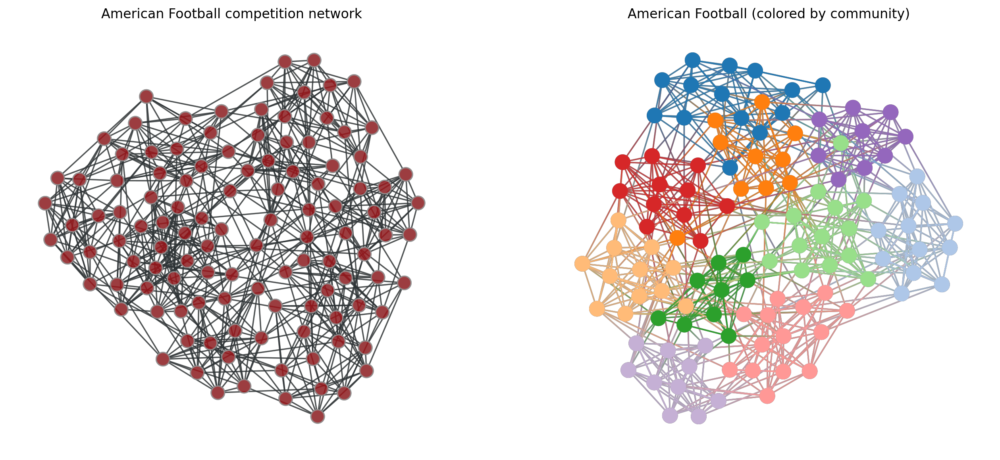

In [31]:
fig, ax = plt.subplots(1,2,figsize=(16,7),dpi=200)

g = gt.collection.data["football"]
a0 = gt.graph_draw(g, mplfig=ax[0], vprops={'size':1})
a0.fit_view()

g = gt.collection.data["football"]
state = gt.minimize_blockmodel_dl(g)
a1 = state.draw(mplfig=ax[1], vprops={'size':1})
a1.fit_view()

ax[0].set_title('American Football competition network')
ax[1].set_title('American Football (colored by community)')
ax[0].set_axis_off()
ax[1].set_axis_off()

plt.show()

### What's so special, why are we so excited about `graph-tool`?
The level of mathematical details underpinning SBM inference *in addition to* the technical/computational details powering the Bayesian inference procedure in `graph-tool` are too extensive to conver in one class. What we hope to convey, though, is core concepts and mathematical objects that:
1. Gives you the ability to use `graph-tool` for community detection
2. Understand specifications, limitations, and the promise of using this framework for detecting mesoscopic structure in your network data
3. Point out areas for future development and trends in the field

________
## Time Machine: From Blockmodels to Block Models

The transition from early stochastic blockmodels (SBMs), widely used in sociology and social network analysis during the 1970s and 80s, to contemporary versions (e.g. those pioneered by Tiago Peixoto), reflects an evolution from simple partitioning techniques to highly sophisticated probabilistic modeling frameworks for community detection and network analysis.

### Early Stochastic Blockmodels (1970s-1980s)
The original SBMs were first introduced in sociology and social network analysis (good starter references: [1,2]) as a way to model social structures and interactions between groups. These early SBMs were primarily focused on detecting communities, or blocks, where nodes within the same block were thought to share similar patterns of connections. These models assumed that each block or group had a specific probability of connection both within and between groups, and they were often used to study social networks, kinship structures, and small-scale organizational networks. Some key aspects of early SBMs:
- **Simple Probabilistic Assumptions**: Each node was assigned to a specific block, and the model defined fixed probabilities of edges occurring within and between blocks. These models typically used maximum likelihood estimation or similar methods to infer block memberships.
- **Limited Scalability**: Early SBMs were computationally expensive and difficult to apply to large networks due to the limited computing power at the time.
- **Static and Deterministic**: These models assumed fixed partitions of nodes and did not incorporate dynamic aspects of networks or node characteristics beyond group membership.

![](images/sbm_1970s.png)

#### References
- [1] White, H.C., Boorman, S.A., & Breiger, R.L. (1976). Social structure from multiple networks. I. Blockmodels of roles and positions. American Journal of Sociology, 81(4), 730-780. https://www.jstor.org/stable/2777596
- [2] Holland, P.W., Laskey, K.B., & Leinhardt, S. (1983). Stochastic blockmodels: First steps. *Social Networks*. 5(2), 109–137. https://doi.org/10.1016/0378-8733(83)90021-7
_____________

#### Canonical and Microcanonical SBMs


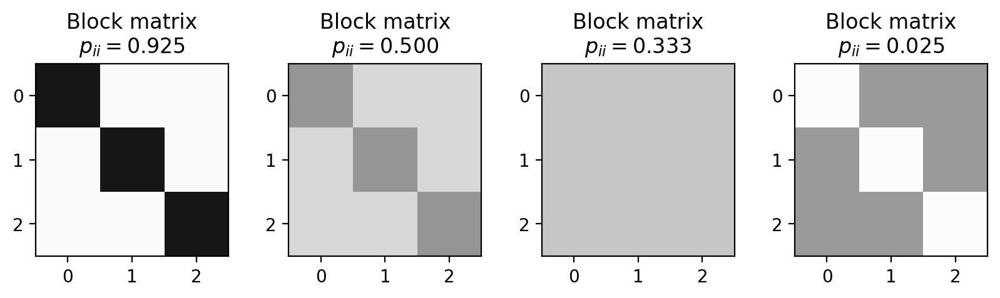

In [32]:
p_ii = 0.925
p_ij = (1-p_ii)/2
block_matrix1 = np.array([[p_ii, p_ij, p_ij], 
                          [p_ij, p_ii, p_ij], 
                          [p_ij, p_ij, p_ii]])

p_ii = 0.5
p_ij = (1-p_ii)/2
block_matrix2 = np.array([[p_ii, p_ij, p_ij], 
                          [p_ij, p_ii, p_ij], 
                          [p_ij, p_ij, p_ii]])

p_ii = 0.3333
p_ij = (1-p_ii)/2
block_matrix3 = np.array([[p_ii, p_ij, p_ij], 
                          [p_ij, p_ii, p_ij], 
                          [p_ij, p_ij, p_ii]])

p_ii = 0.025
p_ij = (1-p_ii)/2
block_matrix4 = np.array([[p_ii, p_ij, p_ij], 
                          [p_ij, p_ii, p_ij], 
                          [p_ij, p_ij, p_ii]])

plot_blocks = [block_matrix1, block_matrix2, block_matrix3, block_matrix4]
pii_list = [0.925, 0.5, 0.3333, 0.025]

fig, ax = plt.subplots(1,4,figsize=(10,2),dpi=200)

for i,b in enumerate(plot_blocks):
    ax[i].imshow(b, vmin=0, vmax=1, cmap='Greys')
    ax[i].set_title('Block matrix\n'+r"$p_{ii} = %.3f$"%(pii_list[i]))


plt.show()

In [33]:
# just for viz purposes, create a layout of the graph we want
N = 150
Gz = nx.ring_of_cliques(3, int(N/3))
pos = nx.kamada_kawai_layout(Gz)

#### "Canonical" Approach: G(n,p) analog
Note here that canonical is not used in the colloquial sense... It's a term from statistical mechanics that describes a system in thermal equilibrium with a heat bath at a fixed temperature. It refers to the collection of all possible microstates of a system, each assigned a probability based on the Boltzmann distribution. The term "canonical" here emphasizes that this ensemble is one of the standard, fundamental ways to describe the statistical properties of a system.

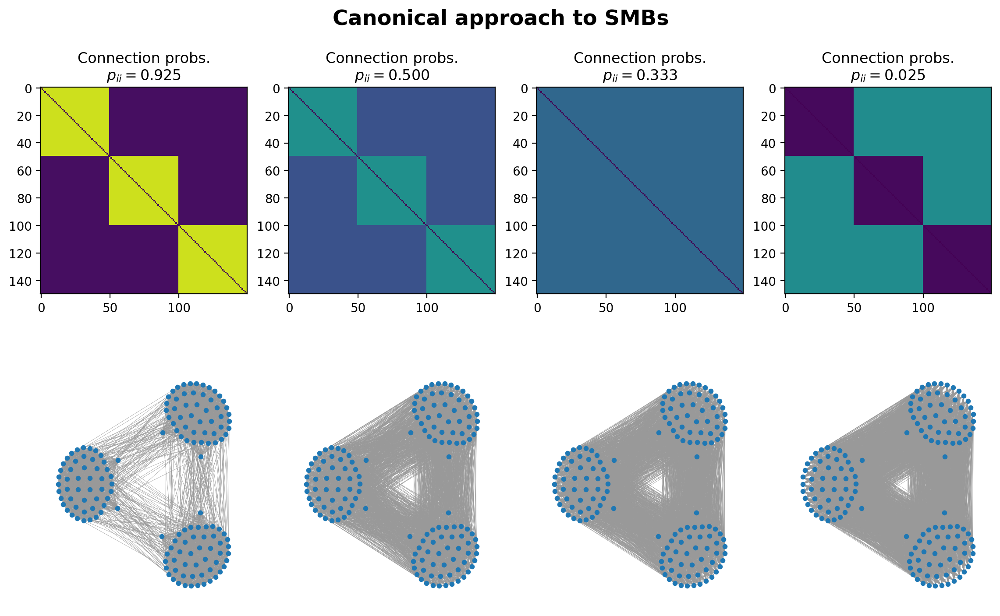

In [34]:
# assign nodes to blocks, then create a matrix of probabilities, p_ij, of node i connecting to node i
partition = [0]*int(N/3) + [1]*int(N/3) + [2]*int(N/3)

fig, ax = plt.subplots(2,4,figsize=(14,8),dpi=200)

for x, block_matrix_x in enumerate(plot_blocks):
    Pij = np.zeros((N,N))

    for i in range(N):
        for j in range(N):
            if i != j:
                b_i = partition[i]
                b_j = partition[j]
                Pij[i,j] = float(block_matrix_x[b_i,b_j])


    ax[(0,x)].imshow(Pij, vmin=0, vmax=1)
    ax[(0,x)].set_title('Connection probs.\n'+r"$p_{ii} = %.3f$"%(pii_list[x]))

    # now sample a random graph from this Pij matrix!
    G = nx.Graph()
    for i in range(N):
        for j in range(N):
            if i > j:
                if np.random.rand() < float(Pij[i,j]):
                    G.add_edge(i,j)
    
    nx.draw(G, pos=pos, node_size=10, width=0.25, edge_color='.6', ax=ax[(1,x)])

plt.suptitle('Canonical approach to SMBs', y=0.965, fontweight='bold', fontsize='xx-large')


plt.show()

#### Microcanonical Approach: G(n,m) analog
A "microcanonical" network ensemble is a collection of graphs that share fixed structural properties, often used to model or study networks with highly constrained features. The term microcanonical is applied because, analogous to physics, certain state variables are conserved, and we only consider networks that strictly obey these constraints.

In [38]:
import itertools as it

def create_graph_from_e(N, e):
    """
    Creates a graph with N nodes and assigns edges based on a predefined 
    edge budget matrix e1, where the nodes are divided into three blocks.

    The adjacency matrix `e1` specifies the number of edges to add between 
    each pair of blocks. Nodes are partitioned equally into three groups, 
    and edges are randomly assigned between and within these groups based 
    on the values in `e1`.

    Parameters:
    ----------
    N : int
        The total number of nodes in the graph. This should be divisible by 3 
        for an equal partitioning of nodes into three groups.

    Returns:
    -------
    G : networkx.Graph
        A graph object where nodes are partitioned into three groups and edges 
        are added based on the edge budget matrix.
    """

    # Create a graph with N nodes
    G = nx.MultiDiGraph()
    G.add_nodes_from(list(range(N)))

    # Define partition for the nodes
    num_blocks = len(e)
    partition = []
    for b in range(num_blocks):
        partition = partition + [b]*int(N/num_blocks)
    
    if len(partition)!=N:
        add_nodes = N-len(partition)
        for _ in range(add_nodes):
            partition.append(partition[-1])

    # Loop over the blocks in the partition    
    for block_i in range(e.shape[0]):
        for block_j in range(e.shape[1]):

            # Get nodes belonging to block i and block j            
            nodes_i = [ix for ix,i in enumerate(partition) if i==block_i]
            nodes_j = [ix for ix,i in enumerate(partition) if i==block_j]
            
            # Get the number of edges to add between blocks
            budget_edges = e[block_i, block_j]
            
            # Create all possible edges between nodes in block_i and block_j
            possible_edges = np.array(list(it.product(nodes_i, nodes_j)))
            
            # Randomly select edges based on the budget
            selected_edges_inds = np.random.choice(
                list(range(len(possible_edges))),
                size=budget_edges,
                replace=True # allow repeat edges?
                # replace=False  # Ensure no repeated edges
            )
            selected_edges = possible_edges[selected_edges_inds]

            # Add the selected edges to the graph
            G.add_edges_from(selected_edges)
    
    return G

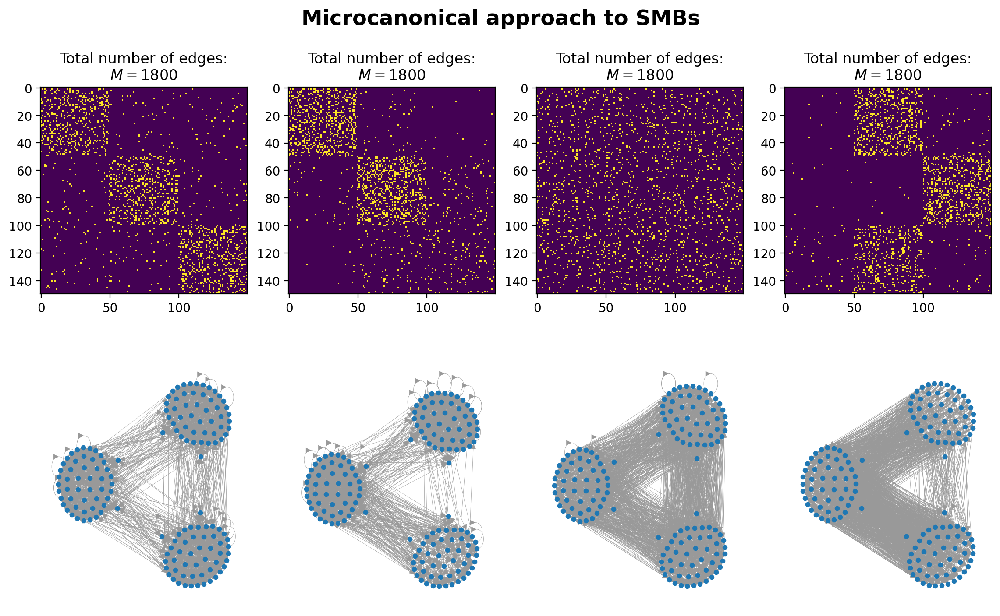

In [39]:
# instead of a matrix of probabilities, we have a matrix of edge counts between blocks
e1 = np.array([[500, 50, 50], 
               [50, 500, 50], 
               [50, 50, 500]])

e2 = np.array([[650, 50, 10], 
               [50, 700, 100], 
               [10, 100, 130]])

e3 = np.array([[200, 200, 200], 
               [200, 200, 200], 
               [200, 200, 200]])

e4 = np.array([[10, 600, 50], 
               [10, 10, 620], 
               [50, 400, 50]])

plot_blocks = [e1,e2,e3,e4]

fig, ax = plt.subplots(2,4,figsize=(14,8),dpi=200)

for x, block_matrix_x in enumerate(plot_blocks):

    Gx = create_graph_from_e(N, block_matrix_x)
    Aij = nx.to_numpy_array(Gx)

    ax[(0,x)].imshow(Aij, vmin=0, vmax=1)
    ax[(0,x)].set_title('Total number of edges:\n'+r"$M = %i$"%(Gx.number_of_edges()))

    nx.draw(Gx, pos=pos, node_size=10, width=0.25, edge_color='.6', ax=ax[(1,x)])

plt.suptitle('Microcanonical approach to SMBs', y=0.965, fontweight='bold', fontsize='xx-large')

plt.show()

____________
### Contemporary Stochastic Block Models
The study of SBMs has significantly advanced, especially over the last 10-15 years, focusing on improving both their theoretical foundations and computational efficiency. Contemporary research addresses many limitations of early SBMs, incorporating more flexible and scalable approaches suitable for large and complex networks. Here's some key innnovations that have ushered in this new era of SBMs:

- **Bayesian Inference**: Today's approaches incorporate Bayesian methods for SBM inference, which offer a more rigorous approach to *selecting the most probable model* and *avoid overfitting*. This allows for estimating the number of blocks directly from the data, removing the need to predefine the number of groups.
- **Degree-Correction (DCSBM)**: A key innovation was to account for the degree heterogeneity within blocks, making it possible to model real-world networks with highly varying node degrees. Early SBMs often assumed homogeneity within blocks, which is leads to poor performance in networks with hubs or highly connected nodes.
- **Hierarchical SBMs**: SBMs have also been extended to hierarchical structures, allowing for multi-level community detection. This is crucial for networks that exhibit nested or overlapping communities, as many real-world networks do (e.g., social, biological, or infrastructure networks).
- **Efficient Inference Algorithms**: Using Markov Chain Monte Carlo (MCMC) and other techniques for sampling the space of partitions to search significantly reduces the computational burden of applying SBMs to large networks, making it feasible to analyze networks with millions of nodes and edges.
- **Model Selection and Regularization**: A Bayesian approach to model selection ensures that the complexity of the model (e.g., the number of blocks) is balanced with its fit to the data. This helps in avoiding overfitting and yields more meaningful community structures.


![](https://skewed.de/lab/posts/inference-compression/generative.png)

**Source:** Inferring, explaining, and compressing (https://skewed.de/lab/posts/inference-compression/)

#### Useful References:
- [1] Peixoto, T.P. (2019). Bayesian Stochastic Blockmodeling, in *Advances in Network Clustering and Blockmodeling* (John Wiley & Sons, Ltd), pp. 289–332. https://doi.org/10.1002/9781119483298.ch11 
- [2] Peixoto, T.P. (2023). Descriptive vs. inferential community detection in networks: Pitfalls, myths and half-truths. Cambridge University Press. https://doi.org/10.1017/9781009118897
- [3] Peixoto, T.P. (2017). Nonparametric Bayesian Inference of the Microcanonical Stochastic Block Model. *Physical Review E* 95, 012317. https://doi.org/10.1103/PhysRevE.95.012317
- [4] Peixoto, T.P. (2014). Hierarchical block structures and high-resolution model selection in large networks. *Physical Review X*. 4, 011047. https://doi.org/10.1103/PhysRevX.4.011047

### Transition Highlights: From the 70s to today
- **From fixed assumptions to flexible (*unsupervised*) models**: Early SBMs assumed simple connection probabilities and homogeneity, while modern SBMs allow for complex structures like degree heterogeneity and hierarchical organizations.
- **From small to large-scale networks**: With computational advances, modern SBMs can handle massive datasets, something that was impractical with earlier models.

Let's dive in some more.
_________

#### Helper function as we transition from/between `networkx` and `graph-tool`

In [40]:
import graph_tool.all as gt

def get_prop_type(value, key=None):
    """
    Performs typing and value conversion for the graph_tool PropertyMap class.
    If a key is provided, it also ensures the key is in a format that can be
    used with the PropertyMap. Returns a tuple, (type name, value, key).

    This function is adapted from Benjamin Bengfort's blog post!
    https://bbengfort.github.io/2016/06/graph-tool-from-networkx/
    """
    if isinstance(key, str):  # Keep the key as a string
        key = key  # No encoding necessary in Python 3

    # Deal with the value
    if isinstance(value, bool):
        tname = 'bool'

    elif isinstance(value, int):
        tname = 'float'
        value = float(value)

    elif isinstance(value, float):
        tname = 'float'

    elif isinstance(value, str):
        tname = 'string'
        
    elif isinstance(value, bytes):
        tname = 'bytes'

    elif isinstance(value, dict):
        tname = 'object'

    else:
        tname = 'string'
        value = str(value)

    return tname, value, key


def nx2gt(nxG):
    """
    Converts a networkx graph to a graph-tool graph.
    """
    # Phase 0: Create a directed or undirected graph-tool Graph
    gtG = gt.Graph(directed=nxG.is_directed())

    # Add the Graph properties as "internal properties"
    for key, value in nxG.graph.items():
        # Convert the value and key into a type for graph-tool
        tname, value, key = get_prop_type(value, key)

        prop = gtG.new_graph_property(tname) # Create the PropertyMap
        gtG.graph_properties[key] = prop     # Set the PropertyMap
        gtG.graph_properties[key] = value    # Set the actual value

    # Phase 1: Add the vertex and edge property maps
    # Go through all nodes and edges and add seen properties
    # Add the node properties first
    nprops = set() # cache keys to only add properties once
    for node, data in nxG.nodes(data=True):

        # Go through all the properties if not seen and add them.
        for key, val in data.items():
            if key in nprops: continue # Skip properties already added

            # Convert the value and key into a type for graph-tool
            tname, _, key  = get_prop_type(val, key)

            prop = gtG.new_vertex_property(tname) # Create the PropertyMap
            gtG.vertex_properties[key] = prop     # Set the PropertyMap

            # Add the key to the already seen properties
            nprops.add(key)

    # Also add the node id: in NetworkX a node can be any hashable type, but
    # in graph-tool node are defined as indices. So we capture any strings
    # in a special PropertyMap called 'id' -- modify as needed!
    gtG.vertex_properties['id'] = gtG.new_vertex_property('string')

    # Add the edge properties second
    eprops = set() # cache keys to only add properties once
    for src, dst, data in nxG.edges(data=True):

        # Go through all the edge properties if not seen and add them.
        for key, val in data.items():
            if key in eprops: continue # Skip properties already added

            # Convert the value and key into a type for graph-tool
            tname, _, key = get_prop_type(val, key)

            prop = gtG.new_edge_property(tname) # Create the PropertyMap
            gtG.edge_properties[key] = prop     # Set the PropertyMap

            # Add the key to the already seen properties
            eprops.add(key)

    # Phase 2: Actually add all the nodes and vertices with their properties
    # Add the nodes
    vertices = {} # vertex mapping for tracking edges later
    for node, data in nxG.nodes(data=True):

        # Create the vertex and annotate for our edges later
        v = gtG.add_vertex()
        vertices[node] = v

        # Set the vertex properties, not forgetting the id property
        data['id'] = str(node)
        for key, value in data.items():
            gtG.vp[key][v] = value # vp is short for vertex_properties

    # Add the edges
    for src, dst, data in nxG.edges(data=True):

        # Look up the vertex structs from our vertices mapping and add edge.
        e = gtG.add_edge(vertices[src], vertices[dst])

        # Add the edge properties
        for key, value in data.items():
            gtG.ep[key][e] = value # ep is short for edge_properties

    # Done, finally!
    return gtG

### Nonparametric Statistical Inference
**Source:** The following is directly modeled from the `graph-tool` cookbooks https://graph-tool.skewed.de/static/doc/demos/inference/inference.html. Find this, and many more informative tutorials on this website.

The goal of the SBM inference procedure is to find a partition that best describes data, without over-fitting. From Tiago Peixoto's cookbook: We want to (from cookbook above) "formulate generative models that include the idea of modules in their descriptions, which then can be detected by inferring the model parameters from data. More precisely, given the partition $\mathbf{b} = \{b_i\}$ of the network into $B$ groups, where $b_i \in [0, B-1]$ is the group membership of node $i$, we define a model that generates a network $\mathbf{A}$ with a probability

$$P(\mathbf{A}|\mathbf{\theta},\mathbf{b})$$

where $\mathbf{\theta}$ are additional model parameters that control how the node partition affects the structure of the network."

The whole trick behind this approach is that after defining this probability $P(\mathbf{A}|\mathbf{\theta},\mathbf{b})$, we can define the *likelihood that our network was generated using a given partition* $\mathbf{b}$ based on Bayes rule:

$$P(\mathbf{b}|\mathbf{A}) = \dfrac{\sum_\mathbf{\theta} P(\mathbf{A}|\mathbf{\theta},\mathbf{b}) P(\mathbf{\theta},\mathbf{b}) }{P(A)}$$

"where $P(\mathbf{\theta}|\mathbf{b})$ is the prior probability of the model parameters and $P(\mathbf{A}) = \sum_{\mathbf{\theta},\mathbf{b}} P(\mathbf{A}|\mathbf{\theta},\mathbf{b}) P(\mathbf{\theta},\mathbf{b})$ is called the *evidence*, and corresponds to the total probability of the data summed over all model parameters. The particular types of model that will be considered here have “hard constraints”, such that there is only one choice for the remaining parameters $\mathbf{\theta}$ that is compatible with the generated network, meaning that our equation above simplifies to 

$$P(\mathbf{b}|\mathbf{A}) = \dfrac{P(\mathbf{A}|\mathbf{\theta},\mathbf{b}) P(\mathbf{\theta},\mathbf{b}) }{P(A)}$$

with $\mathbf{\theta}$ being the only choice compatible with $\mathbf{A}$ and $\mathbf{b}$. The inference procedures considered here will consist in either finding a network partition that maximizes the equation above, or sampling different partitions according its posterior probability. [...] this approach also enables the comparison of different models according to statistical evidence (a.k.a. model selection)."

*(continued from cookbook)*

The equation above can be rewritten as 

$$P(\mathbf{b}|\mathbf{A}) = \dfrac{\exp (-\Sigma)}{P(A)}$$

"where $\Sigma = -\ln P(\mathbf{A}|\mathbf{\theta},\mathbf{b}) - \ln P(\mathbf{\theta},\mathbf{b})$ is the ***description length*** of $\mathbf{A}$. It measures the amount of information required to describe the data, if we encode it using the particular parametrization of the generative model given by $\mathbf{\theta}$ and $\mathbf{b}$, as well as the parameters themselves. Therefore, if we choose to maximize the posterior distribution of Eq. (4) it will be fully equivalent to the so-called minimum description length method. This approach corresponds to an implementation of Occam’s razor, where the simplest model is selected, among all possibilities with the same explanatory power. The selection is based on the statistical evidence available, and therefore will not overfit, i.e. mistake stochastic fluctuations for actual structure. In particular this means that we will not find modules in networks if they could have arisen simply because of stochastic fluctuations, as they do in fully random graphs."

**We want to select a (the) partition that minimizes the description length.**

In [41]:
# Gx = nx2gt(digraph)
# G = gt.extract_largest_component(Gx)

Gx = gt.collection.ns['polblogs']
G = gt.extract_largest_component(Gx)

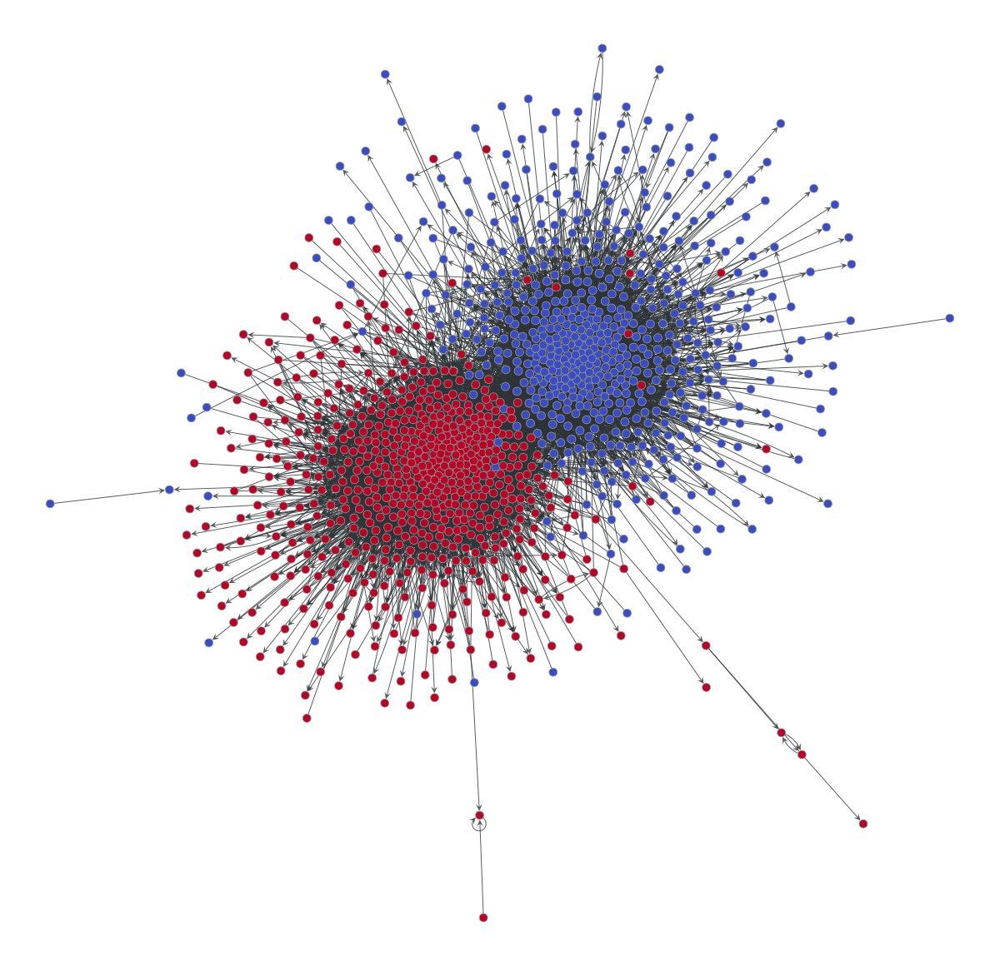

In [42]:
import matplotlib
g = gt.collection.ns["polblogs"]
g = gt.extract_largest_component(g, directed=False)
pos = gt.sfdp_layout(g)

def rotate(pos, a):
    """Rotate the positions by `a` degrees."""
    theta = np.radians(a)
    c, s = np.cos(theta), np.sin(theta)
    R = np.array(((c, -s), (s, c)))
    x, y = pos.get_2d_array()
    cm = np.array([x.mean(), y.mean()])
    return pos.t(lambda x: R @ (x.a - cm) + cm)

pos = rotate(pos, 160)

dprms = dict(fmt="png",  output_size=(600, 600))

gt.graph_draw(g, pos, vertex_fill_color=g.vp.value, vcmap=matplotlib.cm.coolwarm,
           vcnorm=matplotlib.colors.Normalize(vmin=0, vmax=1), **dprms);

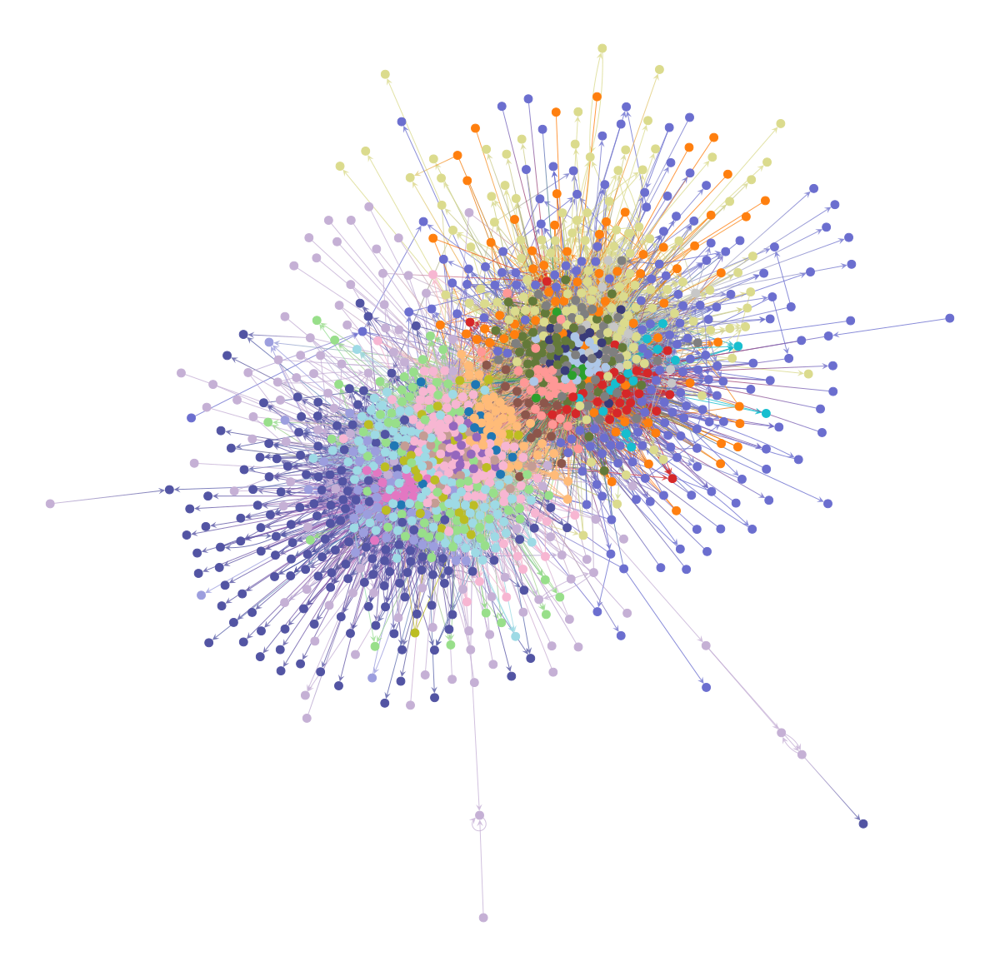

In [43]:
state = gt.minimize_nested_blockmodel_dl(g)
state.levels[0].draw(pos=pos, **dprms);

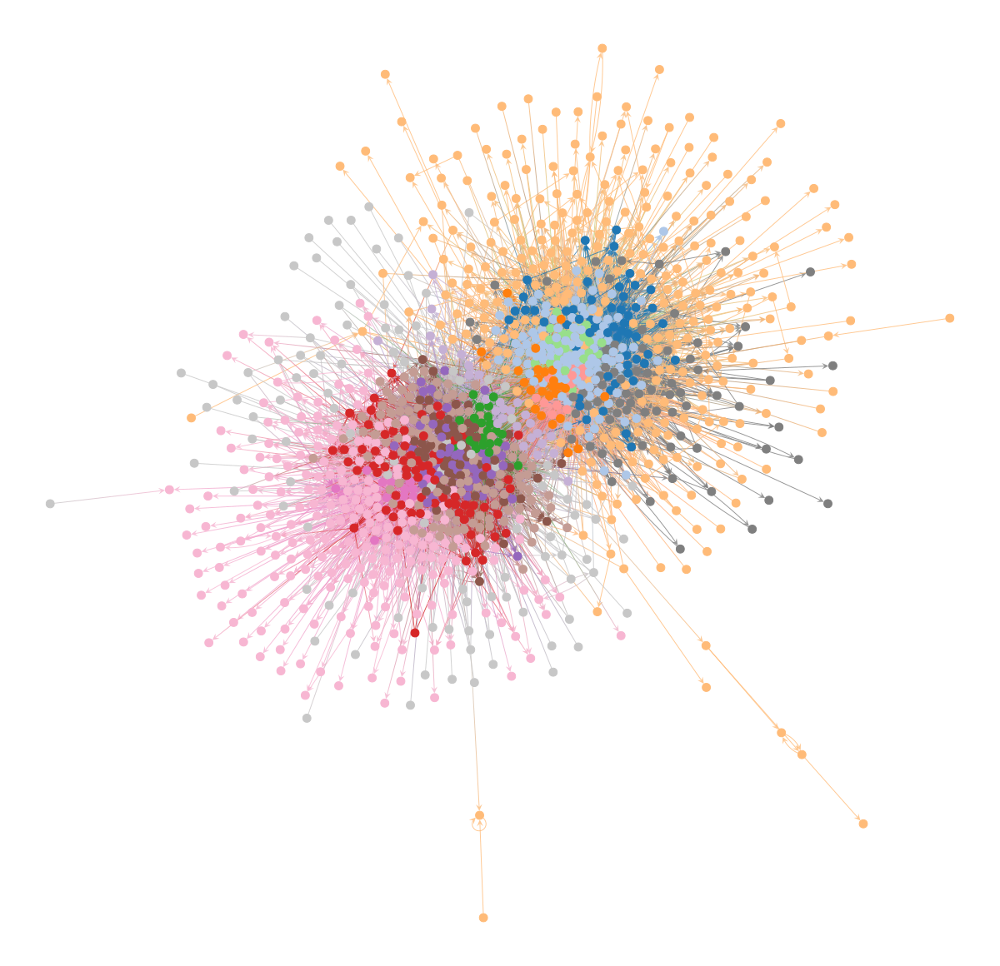

In [45]:
state = gt.minimize_nested_blockmodel_dl(g)
state.levels[0].draw(pos=pos, **dprms);

In [46]:
print("The description length of this partition is", state.entropy())

The description length of this partition is 60800.57886296638


__________

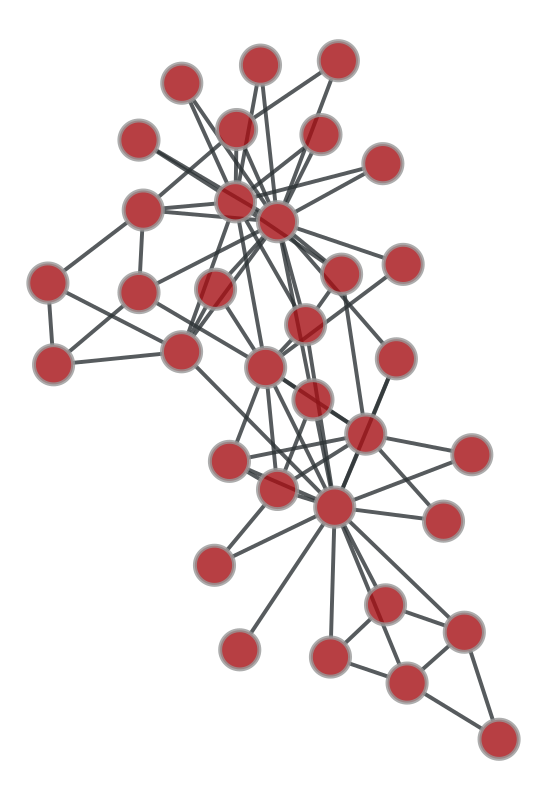

In [23]:
g = nx2gt(nx.karate_club_graph())
gt.graph_draw(g, output_size=(400,400));

### A game: How to describe the network above --- 20 Questions Edition

How would you describe the network you see above? In the fewest ways possible...

______________
#### The art (and mathematics) of minimizing description length

There have been many developments in recent years about smarter ways to find partitions that minimize the description length. From nested SBMs to SBMs that incorporate triadic closure, to network reconstruction, `graph-tool` is able to isolate different important aspects of network structures commonly found in data in order to model (and infer) meaningful structure.

Below is one such example:

![](images/nested_sbm.png)

**Source: https://graph-tool.skewed.de/static/doc/demos/inference/inference.html#the-nested-stochastic-block-model**


But, in general, one could conceive of all sorts of approaches for minimizing the description length of a model...

![](images/mdl_spectrum.png)

**Source: https://skewed.de/lab/posts/objective-inference/**



In [47]:
state_ndc = gt.minimize_blockmodel_dl(G, state_args=dict(deg_corr=False))
state_dc  = gt.minimize_blockmodel_dl(G, state_args=dict(deg_corr=True))

print("Non-degree-corrected DL:\t", state_ndc.entropy())
print("Degree-corrected DL:\t\t", state_dc.entropy(),'\n')

state_ndc_nest = gt.minimize_nested_blockmodel_dl(G, state_args=dict(deg_corr=False))
state_dc_nest  = gt.minimize_nested_blockmodel_dl(G, state_args=dict(deg_corr=True))

print("Non-degree-corrected, nested DL:", state_ndc_nest.entropy())
print("Degree-corrected, nested DL:\t", state_dc_nest.entropy())

Non-degree-corrected DL:	 49264.36371059247
Degree-corrected DL:		 47474.93784121171 

Non-degree-corrected, nested DL: 48295.4940231599
Degree-corrected, nested DL:	 47249.27770979651


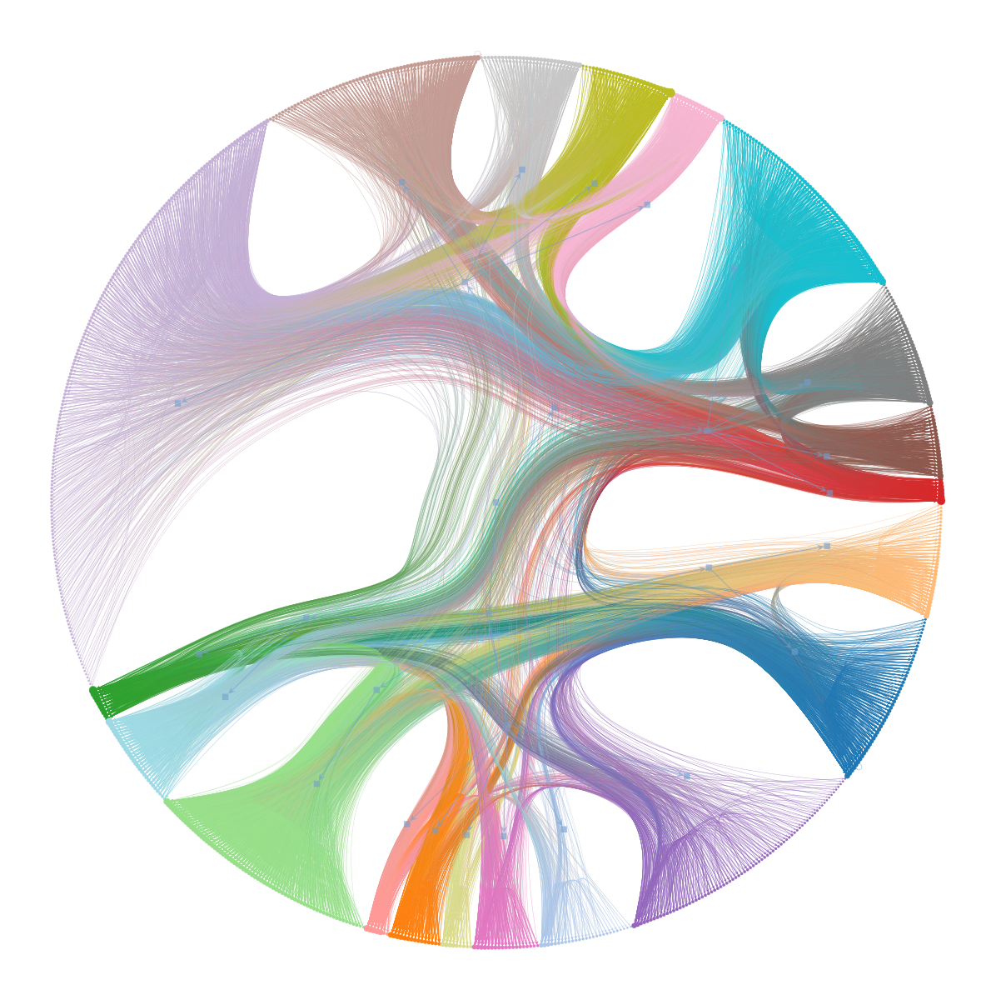

In [48]:
state_dc_nest = gt.minimize_nested_blockmodel_dl(G, state_args=dict(deg_corr=True), multilevel_mcmc_args={'niter':20})
state_dc_nest.draw();

In [49]:
print(state_dc_nest.entropy())

47192.338323056974


### There is so much more to cover in `graph-tool`...
...but one key takeaway: How many communities are detected in Erdős-Rényi networks??

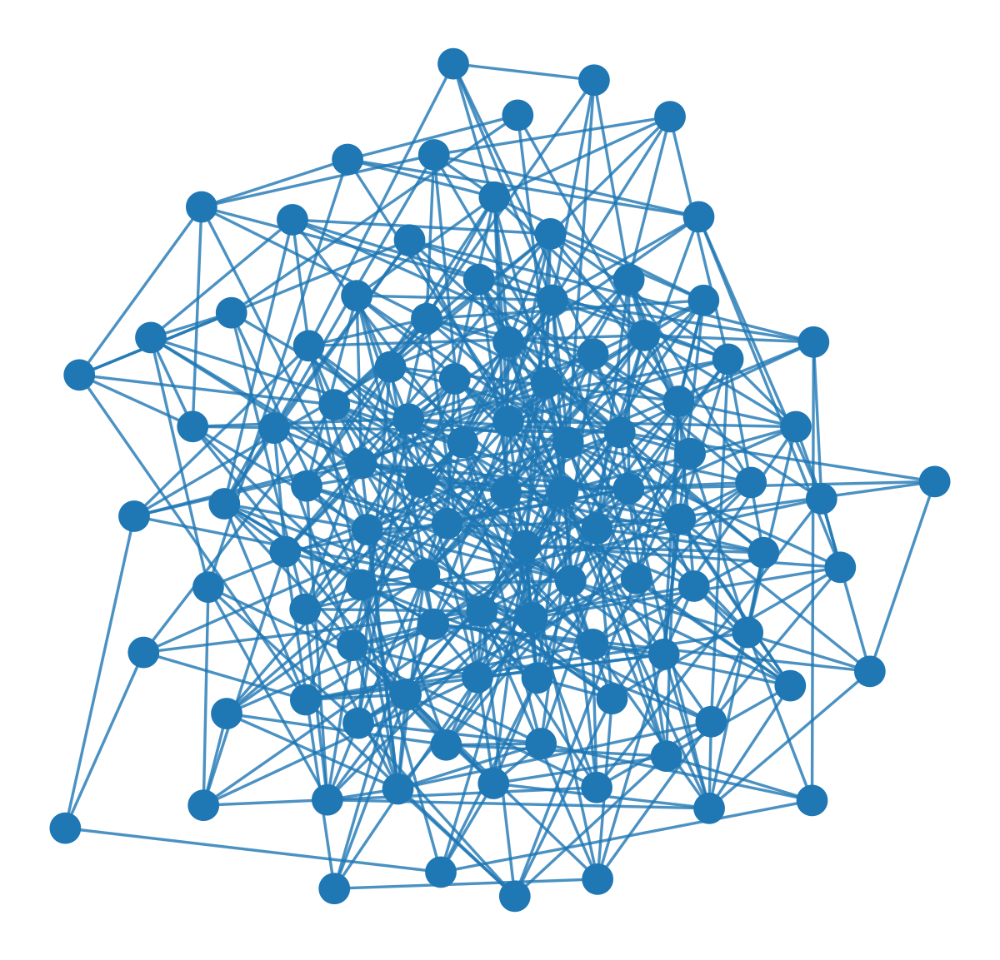

In [50]:
G = nx.erdos_renyi_graph(100, 0.1)
g = nx2gt(G)
state = gt.minimize_blockmodel_dl(g)
state.draw();

## Today, we didn't cover:

1. MCMC sampling procedure (e.g. merge-split algorithm) https://graph-tool.skewed.de/static/doc/demos/inference/inference.html#refinements-using-merge-split-mcmc
2. SBM and topic models https://topsbm.github.io/
3. Uncertain network structure https://graph-tool.skewed.de/static/doc/demos/reconstruction_direct/reconstruction.html
4. Network reconstruction from dynamics https://graph-tool.skewed.de/static/doc/demos/reconstruction_indirect/reconstruction.html
5. Visualization in `graph-tool` (which is awesome!) https://skewed.de/lab/posts/hairball/ (e.g. see below)

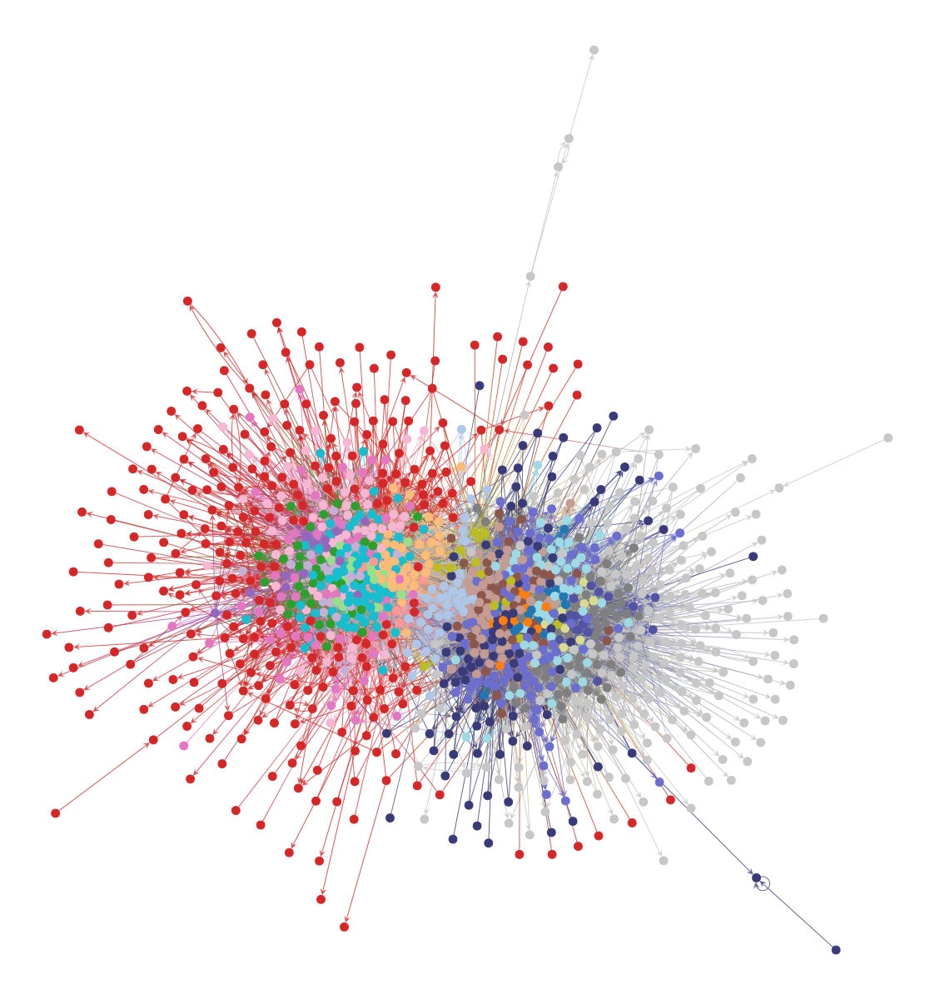

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x18dc1df10, at 0x1df2aab70>

In [28]:
import matplotlib
g = gt.collection.ns["polblogs"]
g = gt.extract_largest_component(g, directed=False)
pos = gt.sfdp_layout(g)

def rotate(pos, a):
    """Rotate the positions by `a` degrees."""
    theta = np.radians(a)
    c, s = np.cos(theta), np.sin(theta)
    R = np.array(((c, -s), (s, c)))
    x, y = pos.get_2d_array()
    cm = np.array([x.mean(), y.mean()])
    return pos.t(lambda x: R @ (x.a - cm) + cm)

pos = rotate(pos, 160)

dprms = dict(fmt="png",  output_size=(600, 600))


state = gt.minimize_nested_blockmodel_dl(g)
state.levels[0].draw(pos=pos, **dprms);

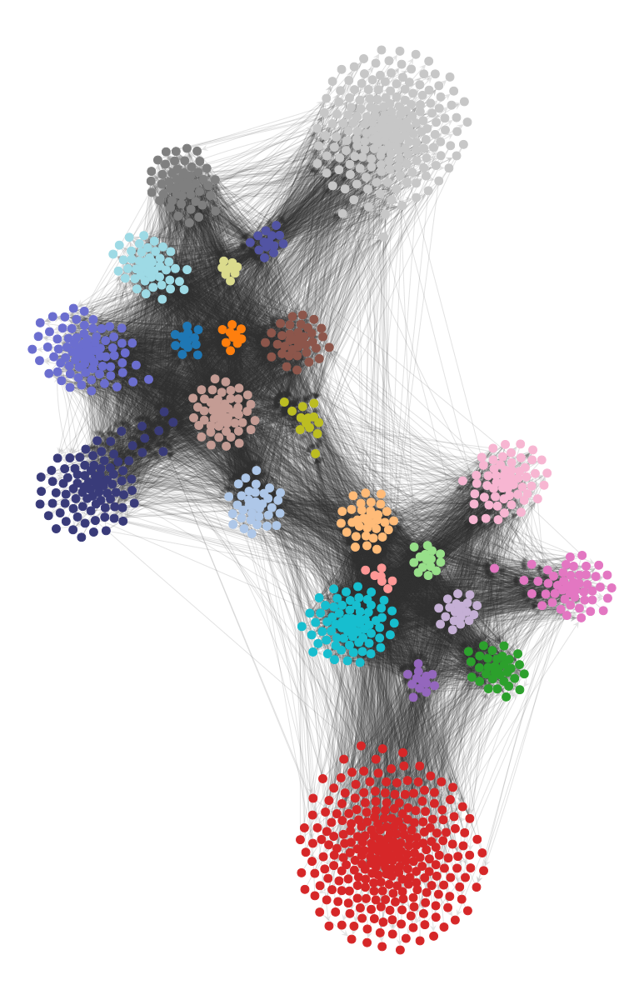

In [29]:
pos2 = gt.sfdp_layout(g, groups=state.levels[0].b, gamma=.04) 
pos2 = rotate(pos2, 110) 
state.levels[0].draw(pos=pos2, edge_gradient=[], edge_color="#33333322", **dprms);

__________
## Next time...
Visualization 1 — Data Viz in Python! `class_12_visualization1.ipynb`
_______

## References and further resources:

1. Class Webpages
    - Jupyter Book: https://asmithh.github.io/network-science-data-book/intro.html
    - Github: https://github.com/asmithh/network-science-data-book
    - Syllabus and course details: https://brennanklein.com/phys7332-fall24
2. `graph-tool` documentation: https://graph-tool.skewed.de/
3. Guimera, R., Sales-Pardo, M., & Amaral, L.A.N. (2004). [Modularity from fluctuations in random graphs and complex networks](https://link.aps.org/doi/10.1103/PhysRevE.70.025101). *Physical Review E*, 70(2), 025101.
4. Tiago Peixoto's blog: https://skewed.de/lab/blog.html
5. Statistical Inference Satellite at the NetSci conference https://sinm.network/
6. Peixoto, T.P. (2013). Parsimonious module inference in large networks. *Physical Review Letters*, 110(14), 148701.
7. Peixoto, T.P. (2014). Hierarchical block structures and high-resolution model selection in large networks. *Physical Review X*, 4(1), 011047.
8. Peixoto, T.P. (2015). Model selection and hypothesis testing for large-scale network models with overlapping groups. *Physical Review X*, 5(1), 011033.
9. Peixoto, T.P. (2023). Descriptive vs. inferential community detection in networks: Pitfalls, myths and half-truths. Cambridge University Press. https://doi.org/10.1017/9781009118897
10. White, H.C., Boorman, S.A., & Breiger, R.L. (1976). Social structure from multiple networks. I. Blockmodels of roles and positions. American Journal of Sociology, 81(4), 730-780. https://www.jstor.org/stable/2777596
11. Holland, P.W., Laskey, K.B., & Leinhardt, S. (1983). Stochastic blockmodels: First steps. *Social Networks*. 5(2), 109–137. https://doi.org/10.1016/0378-8733(83)90021-7
12. Ghasemian, A., Hosseinmardi, H., & Clauset, A. (2019). Evaluating overfit and underfit in models of network community structure. *IEEE Transactions on Knowledge and Data Engineering*, 32(9), 1722-1735. https://doi.org/10.1109/TKDE.2019.2911585